# Кластеризация объявлений

In [1]:
import numpy as np
import pandas as pd
import unicodedata
import re
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import *
from matplotlib import rc
import matplotlib.cm as cm
from matplotlib.pyplot import figure
import plotly.express as px

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler,MinMaxScaler,RobustScaler

from sklearn.model_selection import train_test_split
from sklearn import linear_model, naive_bayes, neighbors, svm
from sklearn.ensemble import RandomForestClassifier

from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering, KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score,silhouette_samples

import psycopg2


pd.options.display.max_columns = 99
pd.set_option('display.width', 1000)

%matplotlib ipympl
%matplotlib inline

RAND = 10


## load data

In [5]:
def get_data_from_price_table() -> pd.DataFrame:
    query = f"""
        SELECT *
        FROM ads
    """
    with psycopg2.connect(database="project_data",
                        host="45.137.67.39",
                        user="airflow",
                        password="airflow",
                        port="5434") as conn:
        df = pd.read_sql(query, conn, index_col = 'ad_id')

    return df

In [6]:
df = get_data_from_price_table()

/var/folders/lc/f07_qqyj1137xf50ymx27mh40000gn/T/ipykernel_90240/882307169.py:11: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, conn, index_col = 'ad_id')


## Очистка данных

**датасет состоит из следующих колонок:**\
**name** - полное наименование объявления \
**price** - цена \
**year** - год выпуска машины \
**stage** - поколение \
**mileage** - пробег  \
**n_owners** - количество владельцев \
**condition** - состояние \
**engine_power** - мощность двигателя \
**engine_vol** - объем двигателя \
**gas_type** -тип топлива \
**transmission** - тип коробки передач \
**gear** - привод \
**car_body** - тип кузова \
**color** - цвет \
**wheel** - сторона расположение руля \
**metro_st** - ближайшая станция метро \
**Географические координаты:** \
**Latitude** - широта расположения объявления \
**Longitude** - долгота расположения объявления

### Заполнение пустых значений:

In [8]:
df.isna().sum()

name                  0
price                 0
publication_date      0
parsing_date          0
stage                19
year                 19
mileage              19
beaten               19
engine_power        106
engine_vol          508
gas_type             19
transmission         19
gear                 19
car_body             19
color                19
wheel                19
n_owners             19
metro_st              0
latitude              0
longitude             0
href                  0
kmeans              830
corr_publ_date        0
brand               329
dtype: int64

Для электрических автомобилей заполним все пустые значения колонки 'engine_capacity'('объем двигателя') и 'engine_power'(мощность двигателя).

In [9]:
m = (df['name'] == 'Tesla Model 3')
df.loc[m,'engine_power'] = df.loc[m,'engine_power'].fillna(258)

In [10]:
m = (df['name'] == 'Tesla Model S')
df.loc[m,'engine_power'] = df.loc[m,'engine_power'].fillna(238)

In [11]:
m = (df['name'] == 'Tesla Model Y')
df.loc[m,'engine_power'] = df.loc[m,'engine_power'].fillna(345)

In [12]:
m = (df['name'] == 'Tesla Model X')
df.loc[m,'engine_power'] = df.loc[m,'engine_power'].fillna(525)

In [13]:
m = (df['gas_type'] == 'Электро')
df.loc[m,'engine_vol'] = df.loc[m,'engine_vol'].fillna(0)

Для машин марки 'Rolls-Royce' объем двигателя также заполним вручную:

Создадим колонку 'first_name' с значениями производителей машин.

In [14]:
df['first_name'] = df['name'].str.split(' ').str[0]

In [15]:
m = (df['first_name'] == 'Rolls-Royce')
df.loc[m,'engine_vol'] = df.loc[m,'engine_vol'].fillna(6.6)

Для машин марки 'Cadillac Escalade' объем двигателя также заполним вручную:

In [16]:
m = (df['name'] == 'Cadillac Escalade')
df.loc[m,'engine_vol'] = df.loc[m,'engine_vol'].fillna(6.2)

Пустые значения engine_vol' - 'объем двигателя' для машин на традиционном виде топлива средними значениями по каждому. Предварительно сделав их числовыми значениями.
производителю машин.

In [17]:
df.engine_vol = df.engine_vol.astype(float)
df.engine_power = df.engine_power.astype(float)

In [18]:
df.loc[df.engine_vol.isnull(), 'engine_vol'] = df.groupby('first_name').engine_vol.transform('mean')

In [19]:
df.loc[df.engine_power.isnull(), 'engine_power'] = df.groupby('name').engine_power.transform('mean')

Удалим объявления у которых почти польностью отсутствуют данные:

In [20]:
df.dropna(subset=['stage'],inplace=True)

In [21]:
df.dropna(subset=['engine_vol'],inplace=True)

In [22]:
df.isna().sum()

name                  0
price                 0
publication_date      0
parsing_date          0
stage                 0
year                  0
mileage               0
beaten                0
engine_power          0
engine_vol            0
gas_type              0
transmission          0
gear                  0
car_body              0
color                 0
wheel                 0
n_owners              0
metro_st              0
latitude              0
longitude             0
href                  0
kmeans              810
corr_publ_date        0
brand               328
first_name            0
dtype: int64

In [23]:
df.n_owners = df.n_owners.replace('4+','4').astype(int)

In [24]:
df.n_owners.unique()

array([1, 2, 4, 3, 0])

In [25]:
col=['price', 'year', 'mileage', 'engine_power', 'engine_vol', 'n_owners']

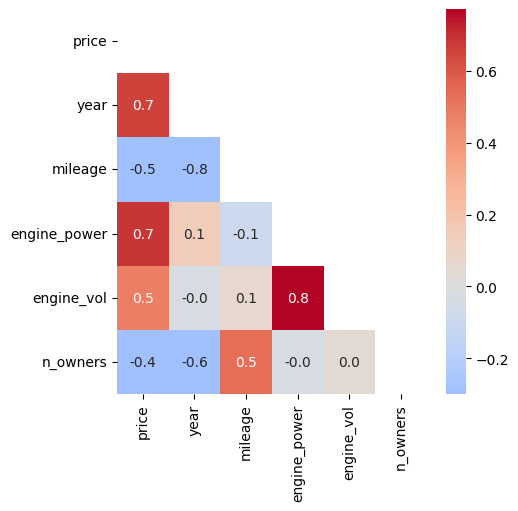

In [34]:

matrix = np.triu(df[col].corr(method='spearman'))

plt.figure(figsize=(5, 5))

sns.heatmap(df[col].corr(method='spearman'), annot=True,
            fmt='.1f', vmin=-0.3, center=0, cmap='coolwarm', mask=matrix);

In [35]:
round(df[col].describe().T)

,count,mean,std,min,25%,50%,75%,max
price,28780.0,1719949.0,1566421.0,101500.0,730000.0,1255430.0,2150000.0,15150000.0
year,28780.0,2015.0,5.0,1998.0,2012.0,2015.0,2019.0,2021.0
mileage,28780.0,113264.0,72712.0,38.0,54000.0,103896.0,159500.0,359763.0
engine_power,28780.0,168.0,69.0,65.0,120.0,150.0,194.0,492.0
engine_vol,28780.0,2.0,1.0,1.0,2.0,2.0,2.0,5.0
n_owners,28780.0,2.0,1.0,1.0,1.0,2.0,3.0,4.0


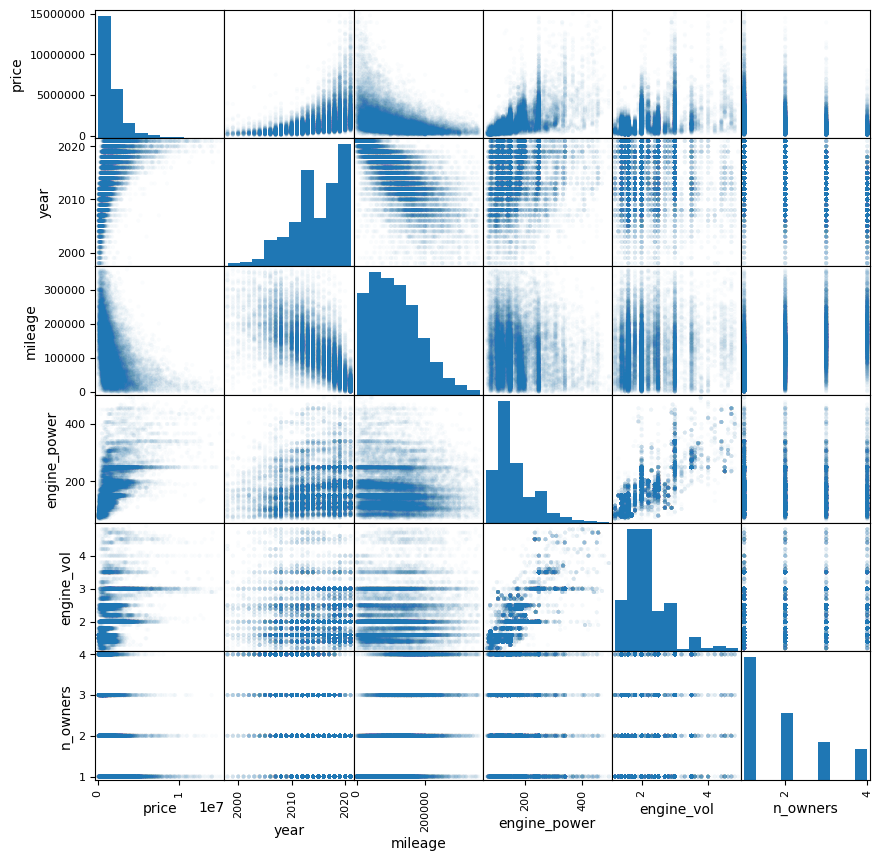

In [36]:
from pandas.plotting import scatter_matrix
scatter_matrix(df[col], alpha=0.02, figsize=(10, 10))
plt.show()

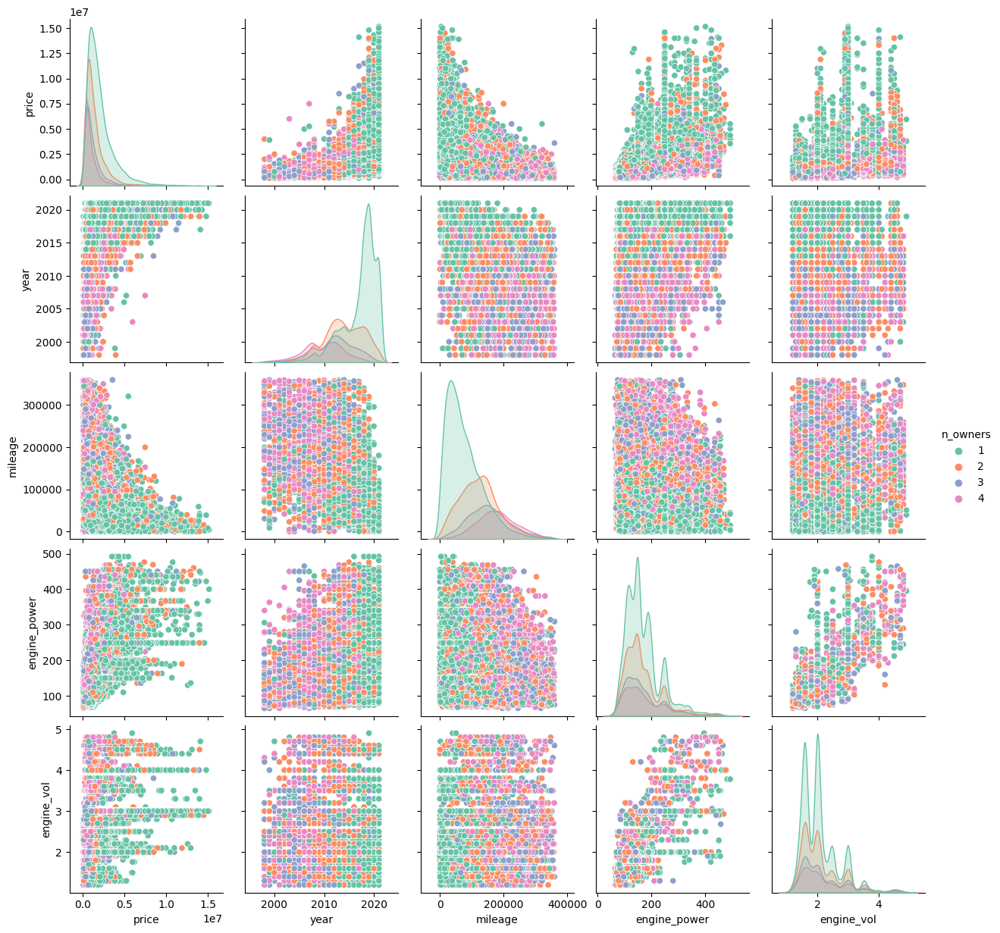

<Figure size 1000x1000 with 0 Axes>

In [37]:
sns.pairplot(df[col], hue='n_owners', palette='Set2')
plt.figure(figsize=(10, 10))
plt.show()

In [38]:
def remove_outliers(data: pd.DataFrame, column: str) -> pd.Series:
    q_low = data[column].quantile(0.01)
    q_hi =data[column].quantile(0.99)
    data = data[(data[column] < q_hi) & (data[column] > q_low)]
    return data

In [39]:
df = remove_outliers(data=df, column='price')
df = remove_outliers(data=df, column='year')
df = remove_outliers(data=df, column='mileage')
df = remove_outliers(data=df, column='engine_power')
df = remove_outliers(data=df, column='engine_vol')

In [40]:
round(df.describe().T)

,count,mean,std,min,25%,50%,75%,max
price,23745.0,1551976.0,1177709.0,172000.0,749000.0,1200000.0,1959000.0,7950000.0
year,23745.0,2014.0,4.0,2003.0,2012.0,2015.0,2018.0,2020.0
mileage,23745.0,117995.0,64831.0,10099.0,65228.0,110555.0,160000.0,311000.0
engine_power,23745.0,166.0,60.0,81.0,122.0,150.0,190.0,404.0
engine_vol,23745.0,2.0,1.0,1.0,2.0,2.0,2.0,4.0
n_owners,23745.0,2.0,1.0,1.0,1.0,2.0,3.0,4.0
latitude,23745.0,55.0,4.0,43.0,56.0,56.0,56.0,69.0
longitude,23745.0,45.0,24.0,21.0,37.0,38.0,38.0,135.0
kmeans,23518.0,3.0,2.0,1.0,2.0,3.0,3.0,6.0


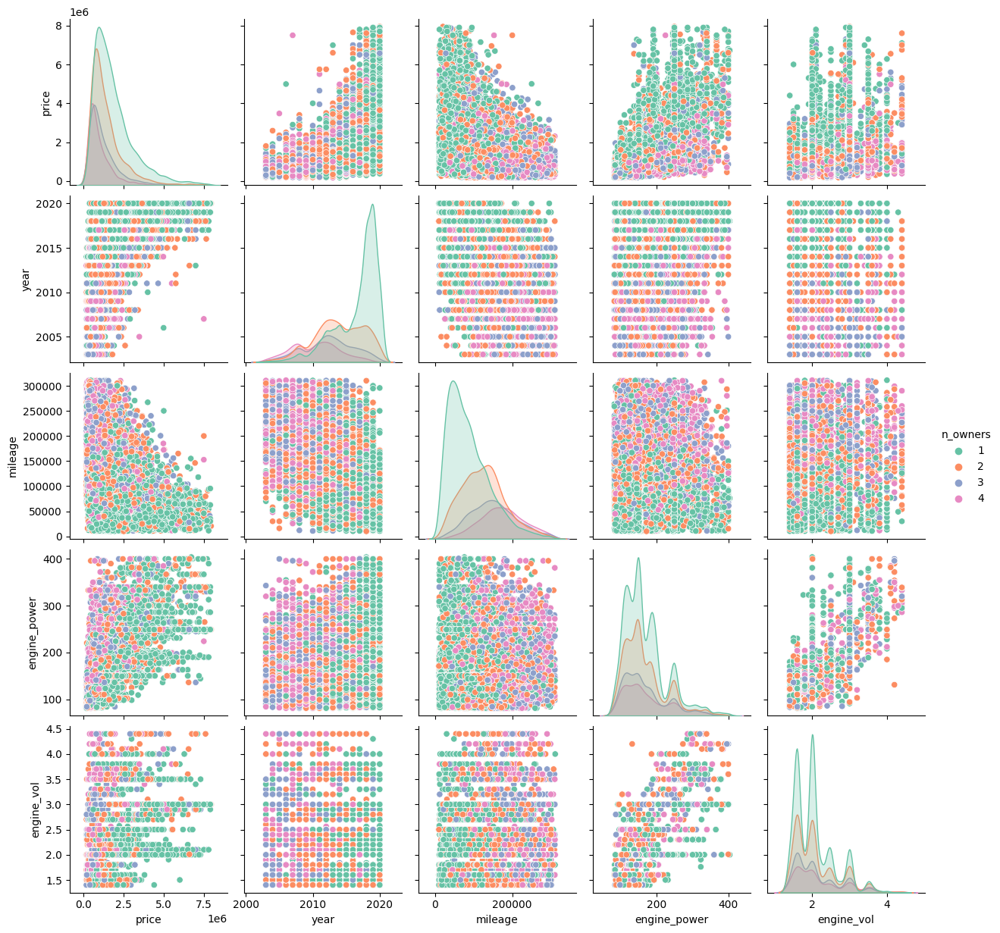

<Figure size 1000x1000 with 0 Axes>

In [41]:
sns.pairplot(df[col], hue='n_owners', palette='Set2')
plt.figure(figsize=(10, 10))
plt.show()

In [42]:
df

,name,price,publication_date,parsing_date,stage,year,mileage,beaten,engine_power,engine_vol,gas_type,transmission,gear,car_body,color,wheel,n_owners,metro_st,latitude,longitude,href,kmeans,corr_publ_date,brand,first_name
ad_id,,,,,,,,,,,,,,,,,,,,,,,,,
2650864182,Kia K7,1935000.0,сегодня в 13:24,2022-11-12,II (2016—2021),2019.0,32833.0,Не битый,159.0,2.4,Гибрид,Автомат,Передний,Седан,Белый,Левый,1,р-н Фрунзенский,43.113153,131.880795,https://www.avito.ru/vladivostok/avtomobili/ki...,2.0,2022-11-12,Kia,Kia
2565570233,Peugeot 308,390000.0,сегодня в 13:24,2022-11-12,I (2007—2011),2011.0,220879.0,Не битый,120.0,1.6,Бензин,Механика,Передний,Хетчбэк,Пурпурный,Левый,1,Говорово,55.653942,37.408607,https://www.avito.ru/moskva/avtomobili/peugeot...,2.0,2022-11-12,Peugeot,Peugeot
2533967851,Ford Mondeo,629000.0,сегодня в 21:09,2022-11-12,IV рестайлинг (2010—2014),2013.0,245000.0,Не битый,145.0,2.0,Бензин,Механика,Передний,Седан,Чёрный,Левый,2,Ясенево,55.606569,37.531323,https://www.avito.ru/moskva/avtomobili/ford_mo...,3.0,2022-11-12,Ford,Ford
2530911051,BMW X6,2390000.0,10 ноября в 09:59,2022-11-12,E71 рестайлинг (2012—2014),2013.0,99722.0,Не битый,306.0,3.0,Бензин,Автомат,Полный,Внедорожник,Белый,Левый,4,Зюзино,55.658285,37.559734,https://www.avito.ru/moskva/avtomobili/bmw_x6_...,4.0,2022-11-10,BMW,BMW
2553609355,Toyota RAV4,1549000.0,8 ноября в 15:40,2022-11-12,IV (2012—2015),2013.0,85000.0,Не битый,180.0,2.5,Бензин,Автомат,Полный,Внедорожник,Белый,Левый,2,Южная,55.626380,37.618228,https://www.avito.ru/moskva/avtomobili/toyota_...,3.0,2022-11-08,Toyota,Toyota
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2480528078,Hyundai Creta,1358000.0,вчера в 13:05,2022-11-21,I (2016—2020),2019.0,44460.0,Не битый,123.0,1.6,Бензин,Механика,Передний,Внедорожник,Серебряный,Левый,1,р-н Калининский,55.169930,61.299831,https://www.avito.ru/chelyabinsk/avtomobili/hy...,NaN,2022-11-20,None,Hyundai
2495149967,BMW 4 серия Gran Coupe,2599000.0,вчера в 13:05,2022-11-21,F36 рестайлинг (2017—2020),2018.0,79830.0,Не битый,190.0,2.0,Дизель,Автомат,Полный,Лифтбек,Белый,Левый,1,Парнас,60.078362,30.377349,https://www.avito.ru/sankt-peterburg/avtomobil...,NaN,2022-11-20,None,BMW
2590456586,Volkswagen Polo,1275000.0,вчера в 13:04,2022-11-21,VI (2020—н. в.),2020.0,40000.0,Не битый,110.0,1.6,Бензин,Автомат,Передний,Лифтбек,Красный,Левый,2,Медведково,55.888026,37.637983,https://www.avito.ru/moskva/avtomobili/volkswa...,NaN,2022-11-20,None,Volkswagen


In [44]:
df_save = df.copy()

In [514]:
df = df_save

In [515]:
df = df.drop(['name', 'publication_date', 'parsing_date', 'stage', 'metro_st', 'latitude', 
     'longitude', 'href', 'kmeans', 'corr_publ_date', 'beaten', 'brand', 'color',
     'first_name', 'car_body', 'gear', 'wheel', 'KMeans', 'gas_type', 'transmission'], axis=1)

In [677]:
df.shape

(23745, 6)

In [233]:
from sklearn.preprocessing import RobustScaler, QuantileTransformer, MaxAbsScaler, MinMaxScaler, StandardScaler, PowerTransformer, Normalizer

In [517]:
scaler = Normalizer()
scaler.fit(df.values)
X_scaled = scaler.transform(df.values)

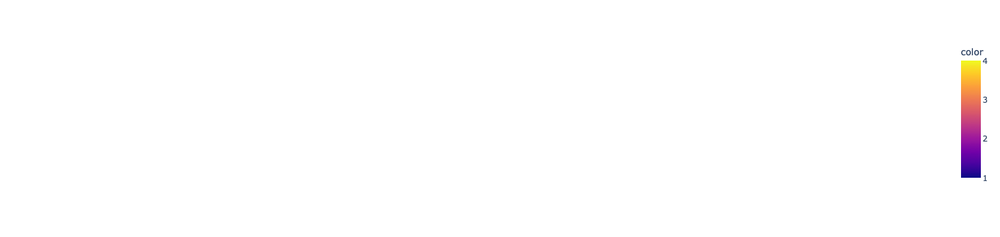

In [518]:
fig = px.scatter_3d(
    X_scaled, x=0, y=1, z=2,
    color=df.n_owners
)
fig.update_traces(marker_size=2)
fig.show()

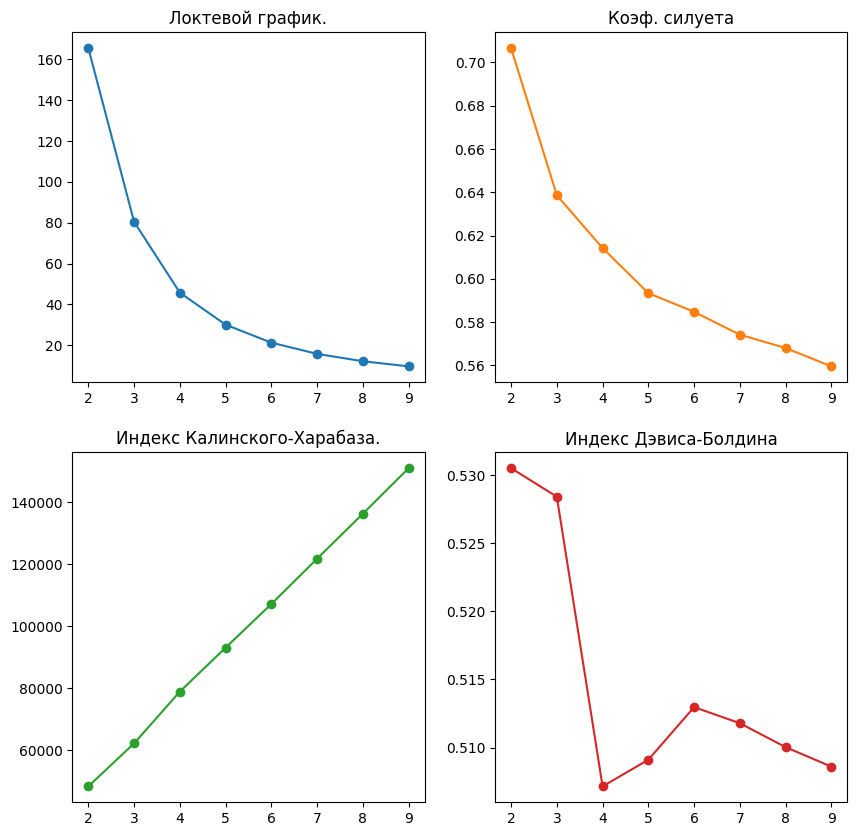

In [519]:
from sklearn import metrics
# различные метрики кластеризации
inertias = [] # локтевой график. Сумма кв. расстояний до цента кластера.
sils = [] # коэф. силуета. от -1 до 1.  Чем выше оценка, тем лучше.
chs = [] #Индекс Калинского-Харабаза. Чем выше оценка, тем лучше.
dbs = [] #Индекс Дэвиса-Болдина. 0 указывает на лучшую кластеризацию. 
sizes = range(2,10)
for k in sizes:
    estimator = KMeans(n_clusters = k)
    estimator.fit(X_scaled)
    inertias.append(estimator.inertia_)
    sils.append(metrics.silhouette_score(X_scaled, estimator.labels_))
    chs.append(metrics.calinski_harabasz_score(X_scaled, estimator.labels_))
    dbs.append(metrics.davies_bouldin_score(X_scaled, estimator.labels_))

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize = (10, 10))
ax1.plot(sizes, inertias,marker='o')
ax2.plot(sizes, sils, 'tab:orange',marker='o',)
ax3.plot(sizes, chs, 'tab:green',marker='o',)
ax4.plot(sizes, dbs, 'tab:red',marker='o',)
ax1.set_title('Локтевой график.')
ax2.set_title('Коэф. силуета')
ax3.set_title('Индекс Калинского-Харабаза.')
ax4.set_title('Индекс Дэвиса-Болдина')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.707
For n_clusters = 3 The average silhouette_score is : 0.639
For n_clusters = 4 The average silhouette_score is : 0.614
For n_clusters = 5 The average silhouette_score is : 0.593
For n_clusters = 6 The average silhouette_score is : 0.585
For n_clusters = 7 The average silhouette_score is : 0.574
For n_clusters = 8 The average silhouette_score is : 0.568
For n_clusters = 9 The average silhouette_score is : 0.56


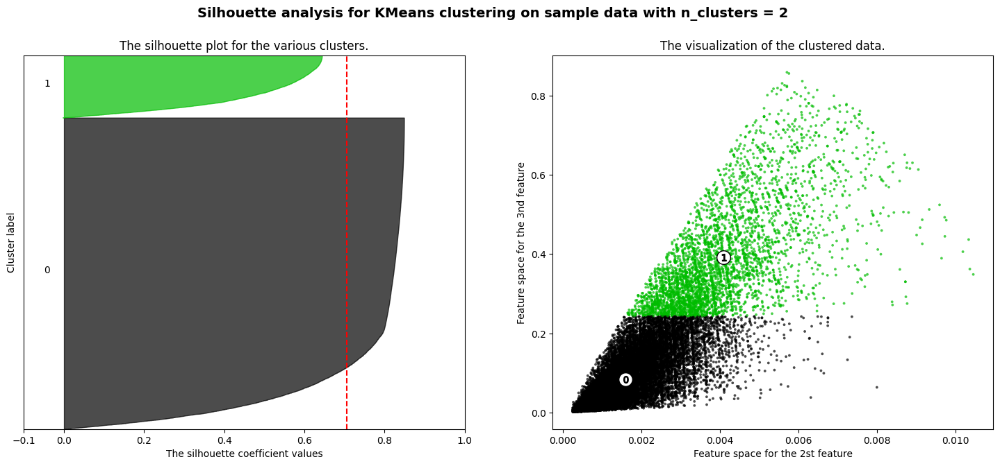

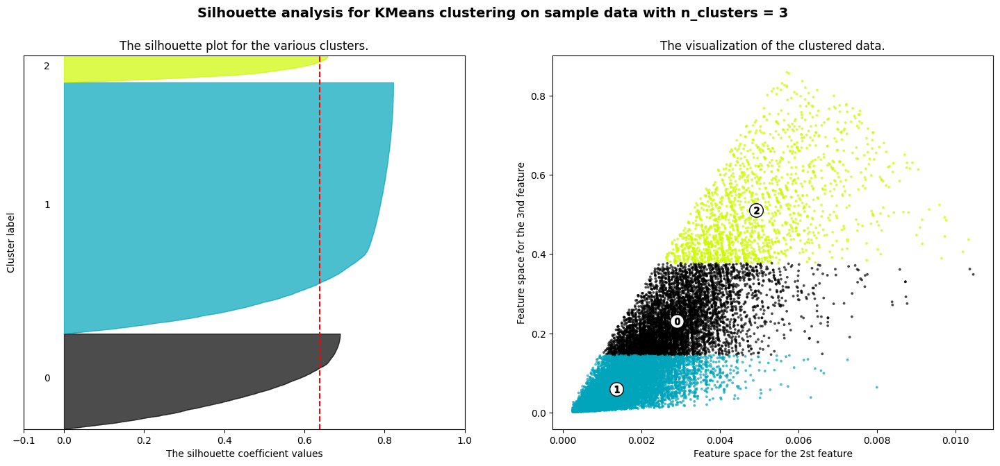

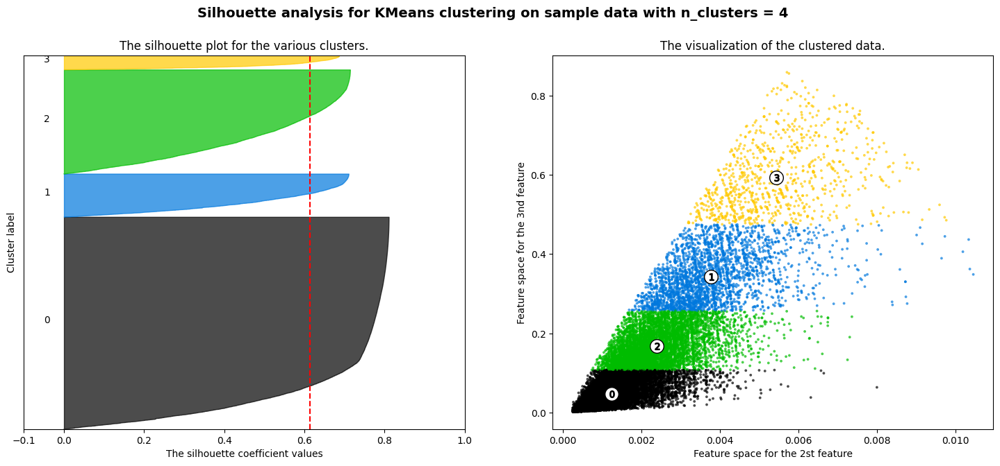

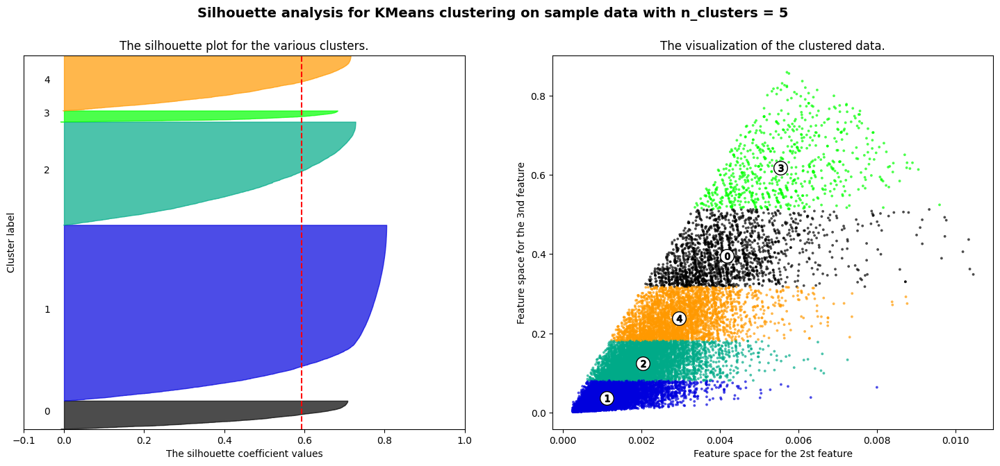

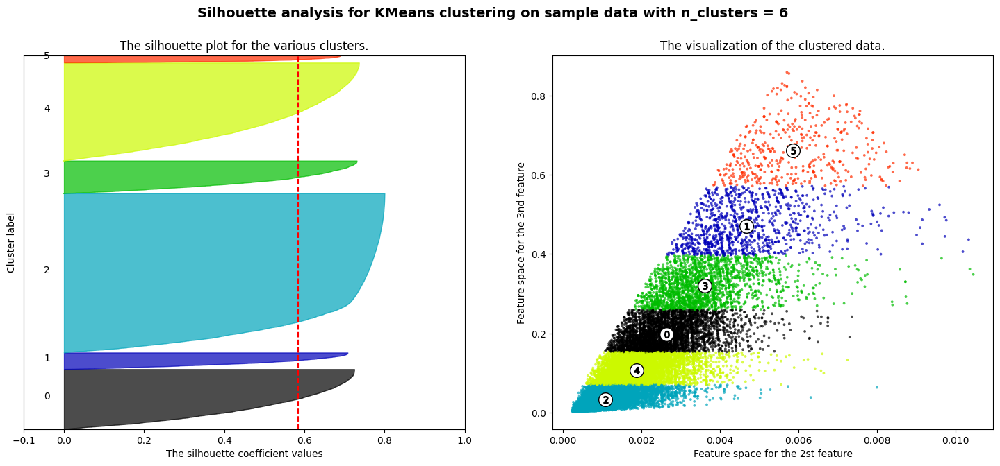

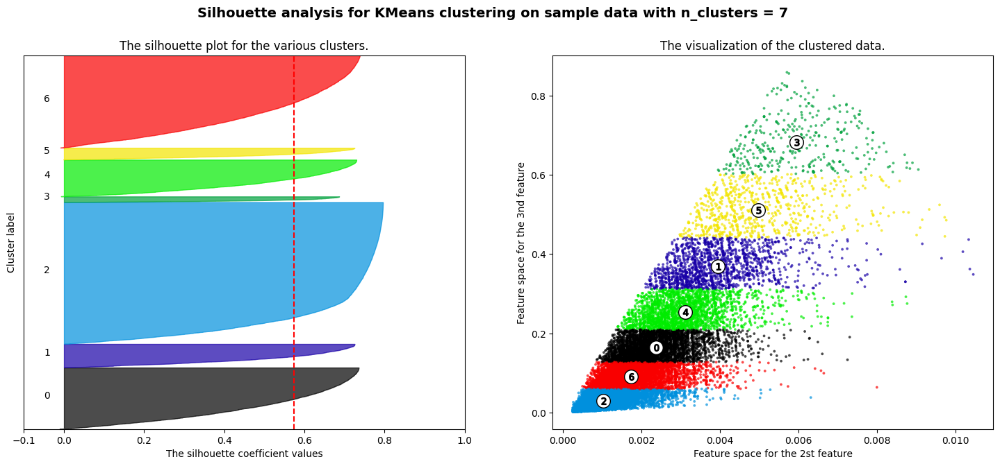

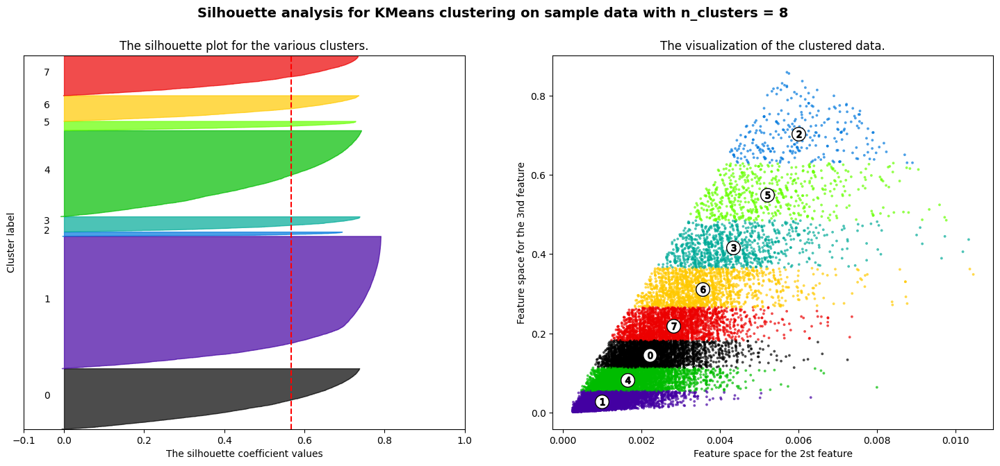

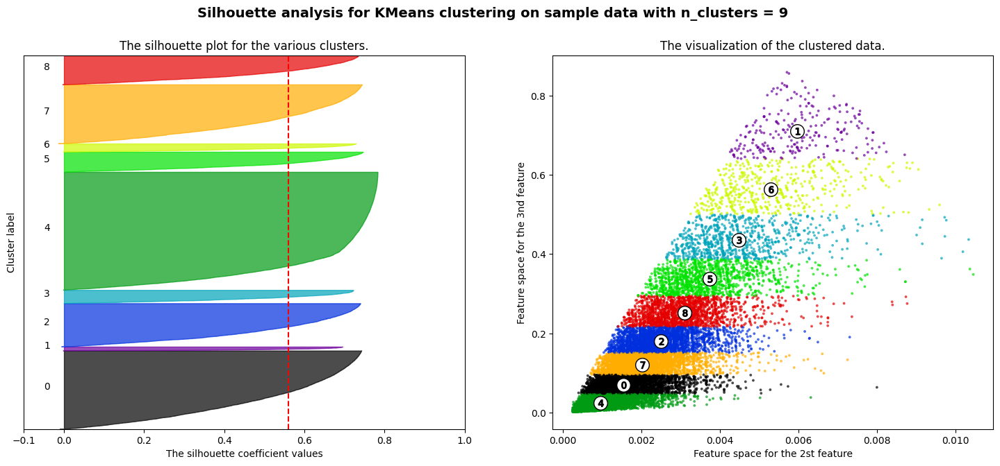

In [291]:
for n_clusters in sizes:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_scaled) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_scaled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg,3))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_scaled[:, 1], X_scaled[:, 2], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 1], centers[:, 2], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[1], c[2], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 2st feature")
    ax2.set_ylabel("Feature space for the 3nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [520]:
km = KMeans(n_clusters=4).fit(X_scaled)

In [676]:
df_save['KMeans']=km.labels_+1
res=df_save.groupby('KMeans')[col].mean()
res['Количество']=df_save.groupby('KMeans').size().values
round(res.sort_values('year'))

,price,year,mileage,engine_power,engine_vol,n_owners,KMeans,Количество
KMeans,,,,,,,,
4,312152.0,2008.0,227128.0,115.0,2.0,3.0,4.0,889
3,540050.0,2010.0,193085.0,134.0,2.0,3.0,3.0,2739
1,922661.0,2012.0,151153.0,155.0,2.0,2.0,1.0,6619
2,2147568.0,2017.0,79310.0,182.0,2.0,2.0,2.0,13498


In [306]:
cat_columns = ['gas_type','transmission','gear','car_body','wheel','n_owners']
val_columns = ['price','year','mileage','engine_power','engine_vol']

In [307]:
def plotting_num(data: pd.DataFrame, labels: np.array, num_cols: list) -> None:
    """
    График kdeplot для сравнения признаков типа int/float между кластерами
    :param data: датасет
    :param labels: метки кластеров
    :param num_cols: колонки типа int/float
    :return: None
    """

    n_cols = len(num_cols)
    rows = n_cols // 3 + 1
    data_label = data.assign(cluster=labels)

    _, axes = plt.subplots(ncols=3, nrows=rows, figsize=(20, 5 * rows))
    plt.subplots_adjust(wspace=0.3, hspace=0.4)

    for num, col in enumerate(num_cols):
        sns.boxplot(
            data=data_label,
            y=col,
            x="cluster",
            palette="crest",
            ax=axes.reshape(-1)[num],
        )

In [308]:
def plotting_kde_num(data: pd.DataFrame, labels: np.array, num_cols: list) -> None:
    """
    График kdeplot для сравнения признаков типа int/float между кластерами
    :param data: датасет
    :param labels: метки кластеров
    :param num_cols: колонки типа int/float
    :return: None
    """

    n_cols = len(num_cols)
    rows = n_cols // 3 + 1
    data_label = data.assign(cluster=labels)

    _, axes = plt.subplots(ncols=3, nrows=rows, figsize=(20, 4 * rows))
    plt.subplots_adjust(wspace=0.3, hspace=0.4)

    for num, col in enumerate(num_cols):
        sns.kdeplot(
            data=data_label,
            x=col,
            hue="cluster",
            fill=True,
            common_norm=False,
            palette="crest",
            alpha=0.4,
            linewidth=2,
            ax=axes.reshape(-1)[num],
        )

In [309]:
def plotting_object(data: pd.DataFrame, labels: np.array, object_cols: list) -> None:
    """
    График heatmap для сравнения признаков типа object между кластерами
    :param data: датасет
    :param labels: метки кластеров
    :param object_cols: колонки типа object
    :return: None
    """

    n_cols = len(object_cols)
    rows = n_cols // 3 + n_cols % 3

    data_label = data.assign(cluster=labels)
    size_cluster = data_label.groupby("cluster").count().iloc[:, 0]

    _, axes = plt.subplots(ncols=3, nrows=rows, figsize=(20, 4 * rows))
    plt.subplots_adjust(wspace=0.3, hspace=0.4)

    for num, col in enumerate(object_cols):
        data_norm = (
            data_label.groupby(["cluster"])[col].value_counts().unstack(fill_value=0).T
            / size_cluster
        )

        data_norm = pd.DataFrame(data_norm.unstack())
        data_norm.columns = ["norm"]
        data_norm = data_norm.reset_index()
        sns.barplot(
            data=data_norm,
            x=data_norm.cluster,
            hue=data_norm[col],
            y=data_norm.norm,
            ax=axes.reshape(-1)[num],
        )

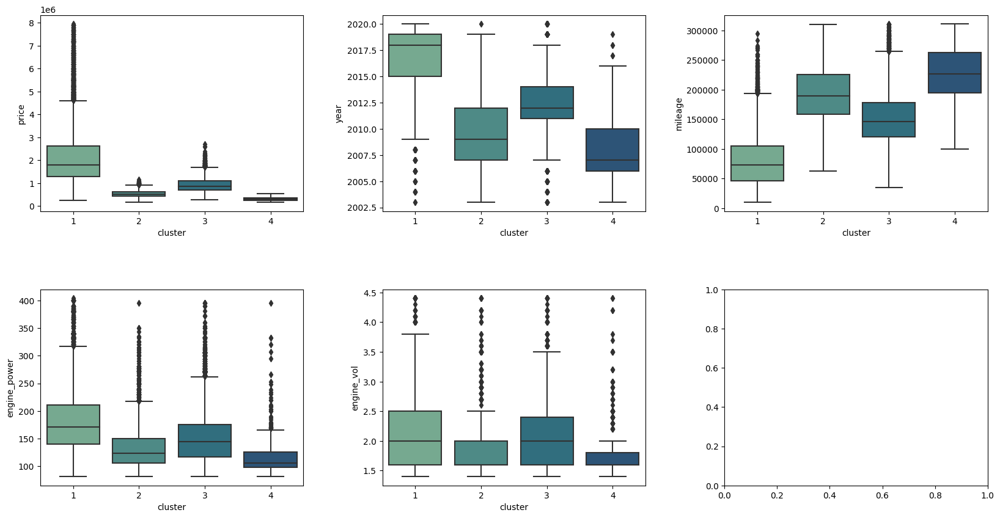

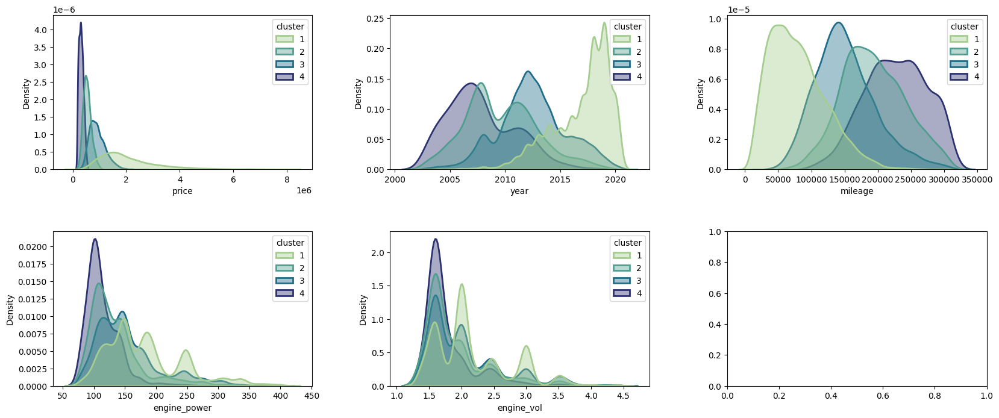

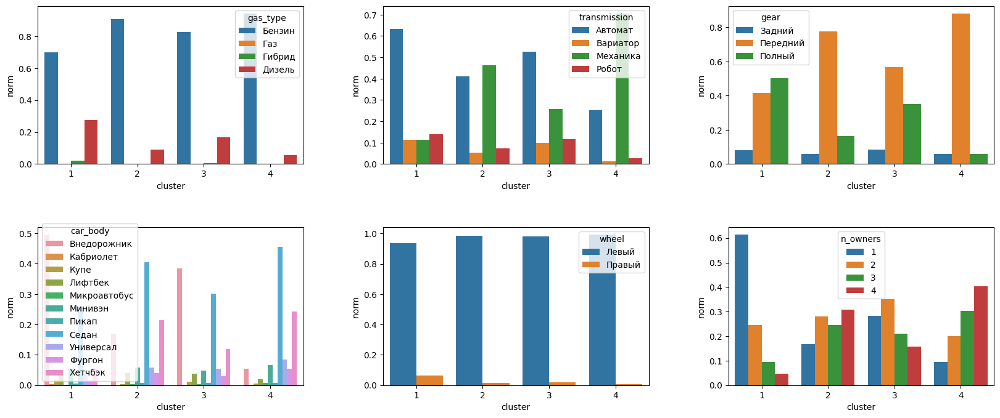

In [310]:
plotting_num(df_save,km.labels_+1, val_columns)
plotting_kde_num(df_save,km.labels_+1, val_columns)
plotting_object(df_save,km.labels_+1, cat_columns)

## Save as pkl

In [166]:
import pickle

In [538]:
df_test = df_save[cols+['KMeans']]

In [539]:
df_test[:4]

,price,year,mileage,engine_power,engine_vol,n_owners,KMeans
ad_id,,,,,,,
2650864182,1935000.0,2019.0,32833.0,159.0,2.4,1,2
2565570233,390000.0,2011.0,220879.0,120.0,1.6,1,4
2533967851,629000.0,2013.0,245000.0,145.0,2.0,2,3
2530911051,2390000.0,2013.0,99722.0,306.0,3.0,4,2


In [540]:
X = df_test.iloc[:4, 0:-1]
X


,price,year,mileage,engine_power,engine_vol,n_owners
ad_id,,,,,,
2650864182,1935000.0,2019.0,32833.0,159.0,2.4,1
2565570233,390000.0,2011.0,220879.0,120.0,1.6,1
2533967851,629000.0,2013.0,245000.0,145.0,2.0,2
2530911051,2390000.0,2013.0,99722.0,306.0,3.0,4


In [569]:
X = df_test.iloc[:4, 0:-1].values
X

array([[1.93500e+06, 2.01900e+03, 3.28330e+04, 1.59000e+02, 2.40000e+00,
        1.00000e+00],
       [3.90000e+05, 2.01100e+03, 2.20879e+05, 1.20000e+02, 1.60000e+00,
        1.00000e+00],
       [6.29000e+05, 2.01300e+03, 2.45000e+05, 1.45000e+02, 2.00000e+00,
        2.00000e+00],
       [2.39000e+06, 2.01300e+03, 9.97220e+04, 3.06000e+02, 3.00000e+00,
        4.00000e+00]])

In [560]:
X = [390000,2011,220879,120,1.6,1]

In [591]:
X = [ 550000, 2011, 123500, 115, 1.6, 2]

In [584]:
X = np.array(X).reshape(1, -1)

In [585]:
X

array([[5.500e+05, 2.011e+03, 1.235e+05, 1.150e+02, 1.600e+00, 2.000e+00]])

In [586]:
X = scaler.transform(X)
X

array([[9.75698415e-01, 3.56750821e-03, 2.19088644e-01, 2.04009669e-04,
        2.83839539e-06, 3.54799424e-06]])

In [556]:
y_pred = km.predict(X)+1
y_pred

array([4], dtype=int32)

In [557]:
import pickle

In [570]:
data = {"model": km, "scaler": scaler}
with open('02_classification.pkl', 'wb') as file:
    pickle.dump(data, file)

In [559]:
with open('02_classification.pkl', 'rb') as file:
    data = pickle.load(file)

classifire_loaded = data["model"]
stand_scaler_loaded = data["scaler"]


In [565]:
X = stand_scaler_loaded.transform(X)
X

array([[8.70129169e-01, 4.48674297e-03, 4.92803233e-01, 2.67732052e-04,
        3.56976069e-06, 2.23110043e-06]])

In [566]:
y_pred = classifire_loaded.predict(X)+1


In [567]:
y_pred

array([4], dtype=int32)

In [ ]:
# X = [649000.0, 2014.0, 109000.0, 180.0, 1.8, 1]

X = [1130000, 2022, 225000, 347, 2, 3]

In [ ]:
X = np.array(X).reshape(1,-1)
# X

In [ ]:
X = stand_scaler_loaded.transform(X)
y_pred = classifire_loaded.predict(X)[0]

In [ ]:
y_pred